# Assignment 1
Monday March 4th, 2019 at 23:59

In [1]:
# Imports
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import math

import folium
from folium import plugins
from IPython.display import Image

#conda install -c conda-forge wordcloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import json

### Helping methods used thoughout the assignment

In [2]:
# Returns a subset of the data depending on given dates at cateories (type of crime)
def getSubSet(dates, crimes, data):
    subset = []
    for date in dates:
        subset.append(data.loc[data['Date'].str.contains(date)])
    subset = pd.concat(subset)
    result = []
    for crime in crimes:
        result.append(subset.loc[subset['Category'].str.contains(crime)])
    return pd.concat(result)

In [3]:
# Import data
#data1 = pd.read_csv("../../airbnb-listings.csv", sep=';')
#print(len(data1))
#dkset = data.loc[data['Country'].str.contains("Denmark", na=False)]
#dkset.to_csv("airbnbDK", sep='\t')
data = pd.read_csv('airbnbDK', sep='\t') 

/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3044: DtypeWarning: Columns (0,1,20,47,50,60,63,64) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
dataSalgstider = pd.read_excel('Salgstider.xlsx') 
dataEjendomspriser = pd.read_excel('Ejendomspriser.xlsx') 

In [5]:
dataEjendomspriser.head(5)

,Postnummer,Navn,2009K1,2009K2,2009K3,2009K4,2010K1,2010K2,2010K3,2010K4,...,2017K1,2017K2,2017K3,2017K4,2018K1,2018K2,2018K3,2018K4,Type Hus,Type Pris
0,1000,1000-1499 Kbh.K.,..,..,..,..,..,..,..,..,...,..,..,..,..,..,..,..,..,Parcel-/rækkehus,Første udbudspris
1,1500,1500-1799 Kbh.V.,..,..,..,..,..,..,..,..,...,..,..,..,..,58497,..,..,..,Parcel-/rækkehus,Første udbudspris
2,1800,1800-1999 Frederiksberg C,..,..,..,..,..,..,..,..,...,..,..,..,..,..,..,..,..,Parcel-/rækkehus,Første udbudspris
3,2000,2000 Frederiksberg,..,34691,32166,33110,36127,37105,37082,38027,...,49283,45608,55740,57346,52548,51550,51970,56069,Parcel-/rækkehus,Første udbudspris
4,2100,2100 København Ø,33439,35023,36291,32394,29061,26958,31495,36581,...,56780,54143,55963,56438,61710,61710,62204,..,Parcel-/rækkehus,Første udbudspris


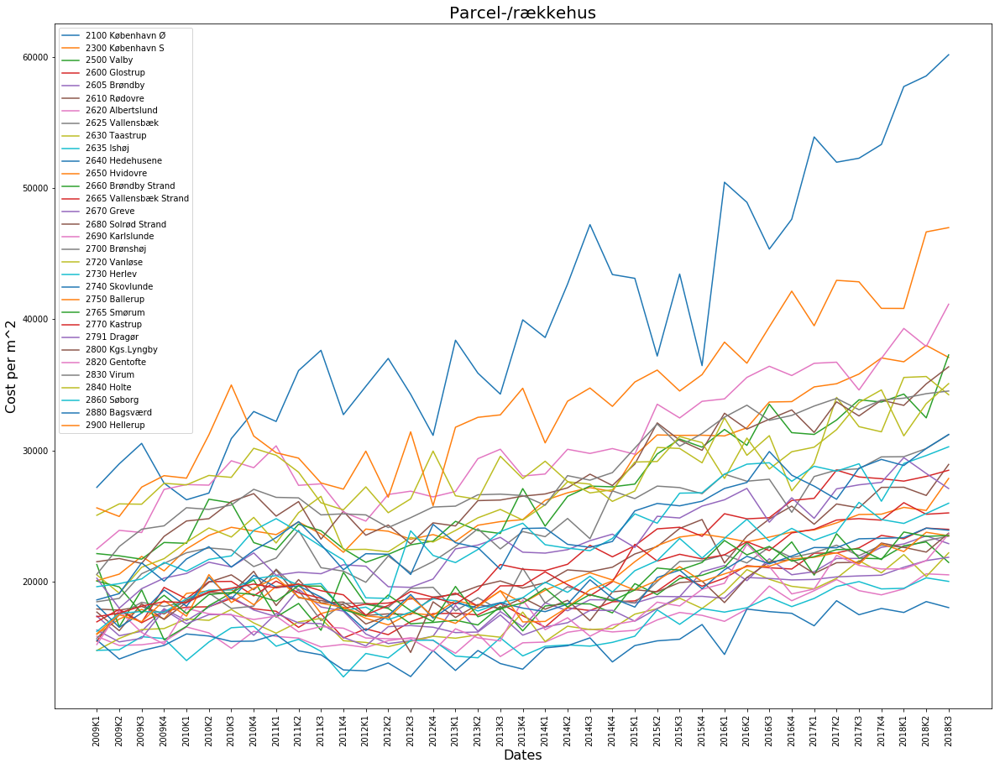

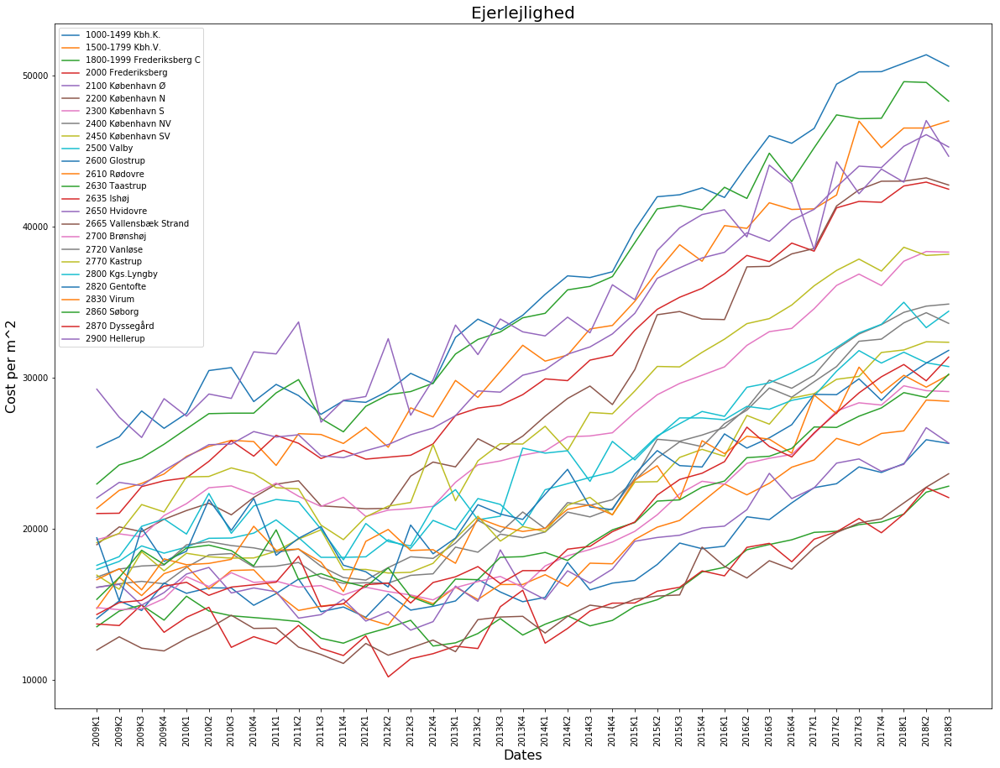

In [6]:
dataPrice = dataEjendomspriser.loc[dataEjendomspriser['Type Pris'].str.contains('Realiseret handelspris')]

for typeHouse in set(dataPrice['Type Hus']):
    subset = dataPrice.loc[dataPrice['Type Hus'].str.contains(typeHouse)]

    legends = []

    plt.figure(figsize=(20,15))
    for row in subset.values:
        temp = [r for r in row[2:41] if r != '..']
        if len(temp) == 39:
            plt.plot(temp)
            legends.append(row[1])

    plt.legend(legends)
    plt.title(typeHouse, fontsize=20)
    plt.xlabel('Dates', fontsize=16)
    plt.ylabel('Cost per m^2', fontsize=16)
    plt.xticks(range(39),subset.keys()[2:41], rotation='vertical')
    plt.show()

In [7]:
subset

,Postnummer,Navn,2009K1,2009K2,2009K3,2009K4,2010K1,2010K2,2010K3,2010K4,...,2017K1,2017K2,2017K3,2017K4,2018K1,2018K2,2018K3,2018K4,Type Hus,Type Pris
215,1000,1000-1499 Kbh.K.,25383,26081,27792,26644,27631,30467,30662,28413,...,46494,49422,50236,50249,50809,51368,50606,48370,Ejerlejlighed,Realiseret handelspris
216,1500,1500-1799 Kbh.V.,21346,22537,22998,23623,24788,25446,25846,25766,...,41168,42084,46974,45216,46517,46517,46982,45075,Ejerlejlighed,Realiseret handelspris
217,1800,1800-1999 Frederiksberg C,22959,24218,24684,25590,26607,27614,27646,27647,...,45211,47387,47135,47164,49585,49535,48296,47502,Ejerlejlighed,Realiseret handelspris
218,2000,2000 Frederiksberg,21005,21023,22785,23170,23368,24458,25820,24801,...,38368,41233,41662,41603,42682,42938,42469,41188,Ejerlejlighed,Realiseret handelspris
219,2100,2100 København Ø,22040,23064,22849,23856,24725,25563,25601,26429,...,41137,42622,43995,43900,45309,46079,45264,45400,Ejerlejlighed,Realiseret handelspris
220,2150,2150 Nordhavn,..,..,..,..,..,..,..,..,...,45612,45298,..,..,..,..,..,..,Ejerlejlighed,Realiseret handelspris
221,2200,2200 København N,18941,20119,19802,20621,21201,21683,20918,22068,...,38542,41359,42428,42997,43003,43218,42745,41412,Ejerlejlighed,Realiseret handelspris
222,2300,2300 København S,19274,19660,19460,20870,21657,22712,22832,22272,...,34560,36100,36851,36093,37703,38344,38306,37854,Ejerlejlighed,Realiseret handelspris
223,2400,2400 København NV,16119,16356,16514,16357,17442,18266,18354,17464,...,30169,31885,32883,33507,34318,34730,34867,32945,Ejerlejlighed,Realiseret handelspris
224,2450,2450 København SV,19082,19697,21597,21110,23426,23456,24023,23652,...,36076,37093,37845,37050,38627,38086,38163,39670,Ejerlejlighed,Realiseret handelspris


In [8]:
data.head(5)

,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",none,...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,101,6.45647e+06,https://www.airbnb.com/rooms/6456469,2.017062e+13,2017-06-15,Cozy rooms in hyggelig family apartment,Welcome to our home :) We normally rent out 2 ...,Welcome to our home :) Our home is the home of...,Welcome to our home :) We normally rent out 2 ...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6934389006, 12.4917170949","Host Has Profile Pic,Is Location Exact"
2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,none,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"
3,103,3.75357e+06,https://www.airbnb.com/rooms/3753571,2.017062e+13,2017-06-15,Newyorkerstyle flat close to center,"Great New York-style apartment, situated in th...","Hi, my name is Birthe. The apartment is fully...","Great New York-style apartment, situated in th...",none,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.67,"55.6647654959, 12.6144187475","Host Has Profile Pic,Host Identity Verified,Is..."
4,104,1.6819e+07,https://www.airbnb.com/rooms/16819024,2.017062e+13,2017-06-15,"Bright and cozy, nordic design, Copenhagen",Charming modern apartment in a quiet location....,Kitchen: Feel free to use all of the equipment...,Charming modern apartment in a quiet location....,none,...,10.0,NaN,NaN,NaN,NaN,moderate,1.0,1.00,"55.6999702064, 12.5214007131","Host Has Profile Pic,Is Location Exact"


In [9]:
set(data['Neighbourhood'].values)

{'Amager Vest',
 'Amager Øst',
 'Amagerbro',
 'Brønshøj',
 'Christianshavn',
 'Frederiksberg',
 'Holmen',
 'Indre By',
 'Islands Brygge',
 'Kastrup',
 'København NV',
 'Kødbyen',
 'Nyboder',
 'Nørrebro',
 'Sluseholmen',
 'Teglholmen',
 'Valby',
 'Vanløse',
 'Vesterbro',
 nan,
 'Østerbro'}

In [10]:
cityAreas = {
    'Amager Vest': 'Amager Vest', 
    'Amagerbro':'Amager Øst',
    'Amager Øst':'Amager Øst',
    'Brønshøj':'Brønshøj-Husum ',
    'Christianshavn':'Christianshavn',
    'Frederiksberg':'Frederiksberg',
    'Holmen':'Indre By',
    'Indre By':'Indre By',
    'Islands Brygge':'Amager Vest',
    'København NV':'Bispebjerg',
    'Kødbyen':'Vesterbro',
    'Nyboder':'Østerbro',
    'Nørrebro':'Nørrebro',
    'Sluseholmen':'Kongens Enghave',
    'Teglholmen':'Kongens Enghave',
    'Valby':'Valby',
    'Vanløse':'Vanløse',
    'Vesterbro':'Vesterbro',
    'Østerbro':'Østerbro',
    'Kastrup':'Amager Vest'
}

In [11]:
data

,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",none,...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,101,6.45647e+06,https://www.airbnb.com/rooms/6456469,2.017062e+13,2017-06-15,Cozy rooms in hyggelig family apartment,Welcome to our home :) We normally rent out 2 ...,Welcome to our home :) Our home is the home of...,Welcome to our home :) We normally rent out 2 ...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6934389006, 12.4917170949","Host Has Profile Pic,Is Location Exact"
2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,none,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"
3,103,3.75357e+06,https://www.airbnb.com/rooms/3753571,2.017062e+13,2017-06-15,Newyorkerstyle flat close to center,"Great New York-style apartment, situated in th...","Hi, my name is Birthe. The apartment is fully...","Great New York-style apartment, situated in th...",none,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.67,"55.6647654959, 12.6144187475","Host Has Profile Pic,Host Identity Verified,Is..."
4,104,1.6819e+07,https://www.airbnb.com/rooms/16819024,2.017062e+13,2017-06-15,"Bright and cozy, nordic design, Copenhagen",Charming modern apartment in a quiet location....,Kitchen: Feel free to use all of the equipment...,Charming modern apartment in a quiet location....,none,...,10.0,NaN,NaN,NaN,NaN,moderate,1.0,1.00,"55.6999702064, 12.5214007131","Host Has Profile Pic,Is Location Exact"
5,105,1.75064e+07,https://www.airbnb.com/rooms/17506370,2.017062e+13,2017-06-15,Copenhagen Beach,114 m2 appartment with 2 balcony's and 2 doubl...,"1st floor, although with elevator also. Plenty...",114 m2 appartment with 2 balcony's and 2 doubl...,none,...,10.0,10.0,9.0,NaN,NaN,strict,1.0,1.63,"55.6632591539, 12.6283070175","Host Has Profile Pic,Host Identity Verified"
6,106,1.35838e+07,https://www.airbnb.com/rooms/13583792,2.017062e+13,2017-06-15,Light and spacious apartment close to all you ...,The apartment is located close to public trans...,The apartment can also accommodate a small bab...,The apartment is located close to public trans...,none,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.35,"55.6566916163, 12.6095054491","Host Has Profile Pic,Host Identity Verified,Is..."
7,107,1.92366e+07,https://www.airbnb.com/rooms/19236631,2.017062e+13,2017-06-15,Big apartment available for 4 persons.,Nice big family-friendly apartment in quit and...,NaN,Nice big family-friendly apartment in quit and...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6791929997, 12.4900073851","Host Has Profile Pic,Instant Bookable"
8,108,1.34432e+07,https://www.airbnb.com/rooms/13443193,2.017062e+13,2017-06-15,Great central apartment CPH,Min bolig lægger tæt på Riccos kaffebar - Holm...,NaN,Min bolig lægger tæt på Riccos kaffebar - Holm...,none,...,NaN,NaN,NaN,NaN,NaN,flexible,1.0,NaN,"55.6657082013, 12.611960628","Host Has Profile Pic,Is Location Exact,Instant..."
9,181,1.05682e+07,https://www.airbnb.com/rooms/10568243,2.017062e+13,2017-06-15,"Family house, Copenhagen",Our very family-friendly home is very near to ...,The house is built in two floors. The kids ca...,Our very family-friendly home is very near to ..

In [12]:
[print("- ",key) for key in data.keys()]

-  Unnamed: 0
-  ID
-  Listing Url
-  Scrape ID
-  Last Scraped
-  Name
-  Summary
-  Space
-  Description
-  Experiences Offered
-  Neighborhood Overview
-  Notes
-  Transit
-  Access
-  Interaction
-  House Rules
-  Thumbnail Url
-  Medium Url
-  Picture Url
-  XL Picture Url
-  Host ID
-  Host URL
-  Host Name
-  Host Since
-  Host Location
-  Host About
-  Host Response Time
-  Host Response Rate
-  Host Acceptance Rate
-  Host Thumbnail Url
-  Host Picture Url
-  Host Neighbourhood
-  Host Listings Count
-  Host Total Listings Count
-  Host Verifications
-  Street
-  Neighbourhood
-  Neighbourhood Cleansed
-  Neighbourhood Group Cleansed
-  City
-  State
-  Zipcode
-  Market
-  Smart Location
-  Country Code
-  Country
-  Latitude
-  Longitude
-  Property Type
-  Room Type
-  Accommodates
-  Bathrooms
-  Bedrooms
-  Beds
-  Bed Type
-  Amenities
-  Square Feet
-  Price
-  Weekly Price
-  Monthly Price
-  Security Deposit
-  Cleaning Fee
-  Guests Included
-  Extra People
-  Minimu

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [13]:
len(data)

20548

In [14]:
# Remove Nan
dataNotNan = data.dropna(subset=['Neighbourhood','Price', 'First Review', 'Last Review', 'Latitude', 'Longitude', 
                                 'Review Scores Rating', 'Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location',  'Review Scores Value' ])
print(len(data), len(dataNotNan))

20548 9511


In [15]:
dataNotNan.reset_index()

,index,Unnamed: 0,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,...,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,0,100,1.32726e+07,https://www.airbnb.com/rooms/13272604,2.017062e+13,2017-06-15,"Centralt, roligt, lyst, hyggeligt og charmerende","85 m2 i 2 plan - tæt på centrum, Frederiksberg...","Det er en charmerende og rummelig lejlighed, s...","85 m2 i 2 plan - tæt på centrum, Frederiksberg...",...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,2.16,"55.6952056557, 12.5112931088","Host Has Profile Pic,Is Location Exact"
1,2,102,1.47852e+07,https://www.airbnb.com/rooms/14785236,2.017062e+13,2017-06-15,Idyllic CPH Villa Apartment near City Center,Our home will be the perfect choice for you an...,The architecture of our Villa apartment is cla...,Our home will be the perfect choice for you an...,...,10.0,6.0,8.0,NaN,NaN,moderate,1.0,0.15,"55.6952347435, 12.5072838591","Host Has Profile Pic,Is Location Exact"
2,3,103,3.75357e+06,https://www.airbnb.com/rooms/3753571,2.017062e+13,2017-06-15,Newyorkerstyle flat close to center,"Great New York-style apartment, situated in th...","Hi, my name is Birthe. The apartment is fully...","Great New York-style apartment, situated in th...",...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.67,"55.6647654959, 12.6144187475","Host Has Profile Pic,Host Identity Verified,Is..."
3,6,106,1.35838e+07,https://www.airbnb.com/rooms/13583792,2.017062e+13,2017-06-15,Light and spacious apartment close to all you ...,The apartment is located close to public trans...,The apartment can also accommodate a small bab...,The apartment is located close to public trans...,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,0.35,"55.6566916163, 12.6095054491","Host Has Profile Pic,Host Identity Verified,Is..."
4,12,184,6.42729e+06,https://www.airbnb.com/rooms/6427286,2.017062e+13,2017-06-15,Lovly room in charming townhouse,A clean and simple room for 2 gests. Close to ...,Biside the room you have access to the kitchen...,A clean and simple room for 2 gests. Close to ...,...,10.0,10.0,10.0,NaN,NaN,moderate,1.0,1.00,"55.7012620598, 12.4744258575","Host Has Profile Pic,Is Location Exact"
5,13,185,1.66878e+07,https://www.airbnb.com/rooms/16687794,2.017062e+13,2017-06-15,Large apartment - spacious & bright,Large and bright apartment (155m2) room enough...,The apartment's large bright living and dinnin...,Large and bright apartment (155m2) room enough...,...,10.0,10.0,10.0,NaN,NaN,flexible,1.0,1.09,"55.7062542979, 12.4939881108","Host Has Profile Pic,Host Identity Verified,Is..."
6,14,186,9.99168e+06,https://www.airbnb.com/rooms/9991682,2.017062e+13,2017-06-15,Quiet residence near city center,"Cosy, light, kids friendly house with beautifu...",NaN,"Cosy, light, kids friendly house with beautifu...",...,10.0,9.0,10.0,NaN,NaN,moderate,1.0,0.40,"55.7031744047, 12.481209474","Host Has Profile Pic,Is Location Exact"
7,15,187,3.65772e+06,https://www.airbnb.com/rooms/3657721,2.017062e+13,2017-06-15,Fantastic house close to downtown,Locatet 15 min. on bike from Copenhagen down t...,The direct access to the park with playground ...,Locatet 15 min. on bike from Copenhagen down t...,...,10.0,10.0,8.0,NaN,NaN,moderate,1.0,0.09,"55.7136742318, 12.5104238606","Host Has Profile Pic,Is Location Exact,Instant..."
8,16,188,1.37217e+07,https://www.airbnb.com/rooms/13721700,2.017062e+13,2017-06-15,Cosy Room in Copenhagen,"Hey there, we are a couple of students and we ...",NaN,"Hey there, we are a couple of students and we ...",...,10.0,8.0,10.0,NaN,NaN,flexible,2.0,0.10,"55.715782915, 12.4604101103","Host Has Profile Pic,Host Identity Verified,Is..."
9,19,191,1.87298e+07,https://www.airbnb.com/rooms/18729765,2.017062e+13,2017-06-15,Fashionable Copenhagen home,"Stay in a fashionable, traditional Copenhagen ...",The apartment is in a private building in a qu...,"Stay in a fashionable, traditional Copenhagen ...

In [16]:
dataNotNan['District'] = [cityAreas[n] for n in dataNotNan['Neighbourhood'].values]
set(dataNotNan['District'])

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


{'Amager Vest',
 'Amager Øst',
 'Bispebjerg',
 'Brønshøj-Husum ',
 'Christianshavn',
 'Frederiksberg',
 'Indre By',
 'Kongens Enghave',
 'Nørrebro',
 'Valby',
 'Vanløse',
 'Vesterbro',
 'Østerbro'}

In [17]:
set(dataNotNan['Zipcode'].values)

{'1051',
 '1052',
 '1053',
 '1054',
 '1055',
 '1057',
 '1061',
 '1063',
 '1066',
 '1068',
 '1069',
 '1071',
 '1074',
 '1104',
 '1107',
 '1110',
 '1112',
 '1113',
 '1114',
 '1116',
 '1123',
 '1124',
 '1127',
 '1129',
 '1130',
 '1150',
 '1151',
 '1152',
 '1153',
 '1154',
 '1157',
 '1158',
 '1159',
 '1161',
 '1164',
 '1165',
 '1171',
 '1172',
 '1173',
 '1174',
 '1200',
 '1203',
 '1204',
 '1205',
 '1207',
 '1208',
 '1209',
 '1210',
 '1211',
 '1220',
 '1251',
 '1253',
 '1254',
 '1255',
 '1256',
 '1260',
 '1261',
 '1264',
 '1266',
 '1270',
 '1300',
 '1302',
 '1304',
 '1306',
 '1307',
 '1308',
 '1310',
 '1311',
 '1312',
 '1313',
 '1314',
 '1315',
 '1316',
 '1317',
 '1318',
 '1319',
 '1320',
 '1350',
 '1352',
 '1353',
 '1354',
 '1355',
 '1355 K',
 '1356',
 '1357',
 '1358',
 '1359',
 '1360',
 '1361',
 '1362',
 '1363',
 '1364',
 '1365',
 '1366',
 '1367',
 '1368',
 '1369',
 '1370',
 '1400',
 '1401',
 '1402',
 '1403',
 '1408',
 '1411',
 '1412',
 '1413',
 '1415',
 '1416',
 '1417',
 '1418',
 '1420',

In [18]:
def isfloat(value):
  try:
    float(value)
    return True
  except ValueError:
    return False

In [19]:
def addCrimeLocations(m, fgv, color, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = color, 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [20]:
m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")

m = addCrimeLocations(m, fgv, 'Red', dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locations.html")
m
#Image("locations.png")

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


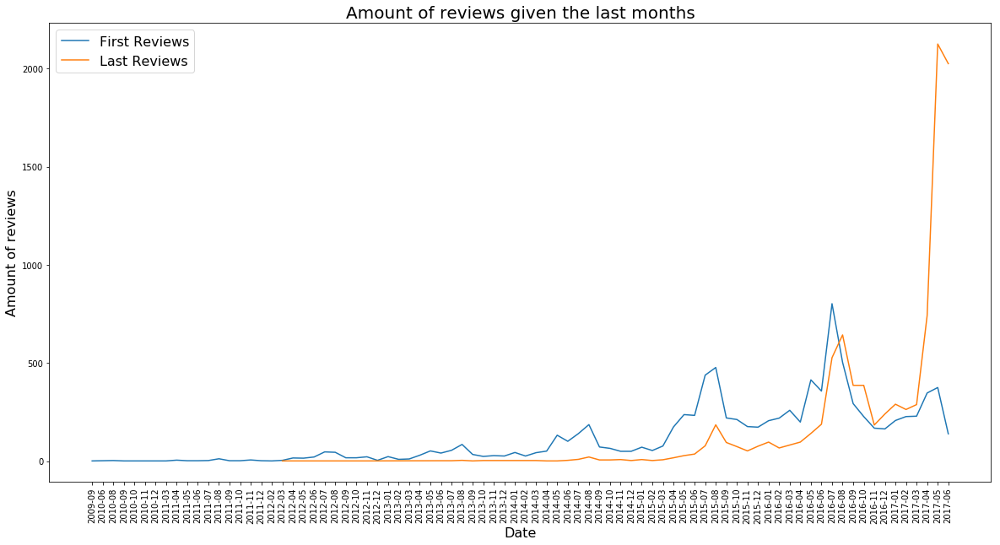

In [21]:
dataNotNan['First Review Month'] = [fr[:7] for fr in dataNotNan['First Review'].values]
firstReviewData = dataNotNan.groupby('First Review Month').count()['ID']

dataNotNan['Last Review Month'] = [fr[:7] for fr in dataNotNan['Last Review'].values]
lastReviewData = dataNotNan.groupby('Last Review Month').count()['ID']

plt.figure(figsize=(20,10))

plt.plot(firstReviewData.keys(), firstReviewData.values)


plt.plot(lastReviewData.keys(), lastReviewData.values)

plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['First Reviews','Last Reviews'], fontsize=16)
plt.xlabel('Date', fontsize=16)
plt.ylabel('Amount of reviews', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.savefig("reviews.png")
plt.show()

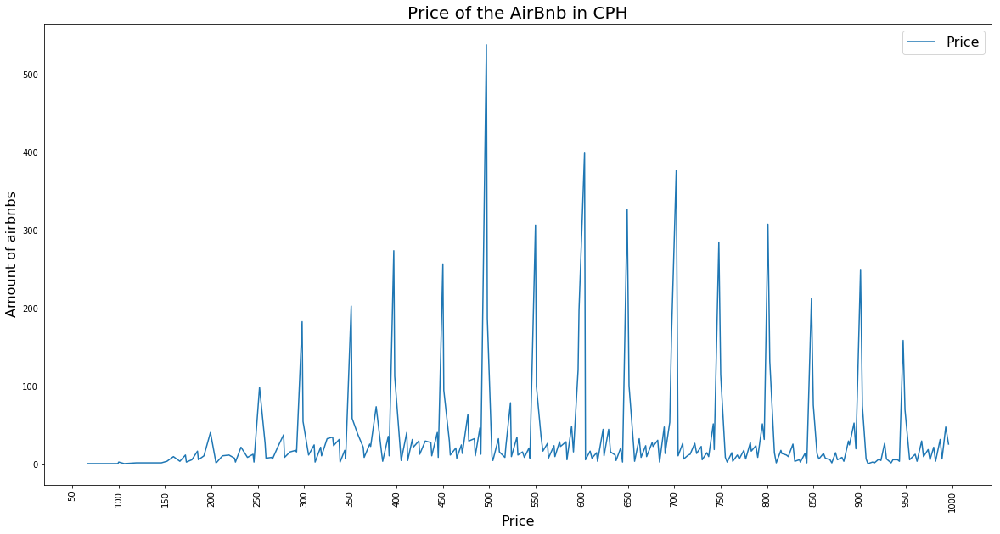

In [22]:
plt.figure(figsize=(20,10))
dataP = dataNotNan.groupby('Price')['ID'].count()

minP = min(dataP.keys())-min(dataP.keys())%50
maxP = max(dataP.keys())+50

plt.plot(dataP.keys(), dataP.values)

plt.xticks(np.arange(minP, maxP, 50.0), rotation='vertical')
plt.legend(['Price'], fontsize=16)
plt.xlabel('Price', fontsize=16)
plt.ylabel('Amount of airbnbs', fontsize=16)
plt.title('Price of the AirBnb in CPH', fontsize=20)
plt.savefig('pris.png')
plt.show()

In [23]:
def addCrimeLocationsColors(m, fgv, colors, data):
    for bnb in data.values:
        if(isfloat(bnb[46]) and isfloat(bnb[47]) and str(bnb[47]) != 'nan'):
            fgv.add_child(folium.CircleMarker(
                location=[float(bnb[46]), float(bnb[47])], 
                radius = 1,
                fill=False, 
                color = colors[int(bnb[93]/200)], 
                fill_opacity=0.5))
    
    m.add_child(fgv)
    return m

In [26]:
dataNotNan['Price to nearest 200'] = [p-p%200 if p%200 < 100 else p+(200-p%200) for p in dataNotNan['Price'].values]

m = folium.Map([55.679698, 12.550467], zoom_start=12)
fgv = folium.FeatureGroup(name="Locations")

# ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 
#  'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 
#  'darkpurple', 'white', 'pink', 'lightblue', 'lightgreen', 
#  'gray', 'black', 'lightgray']
colors = ['yellow','green','cadetblue','orange','red','purple']

m = addCrimeLocationsColors(m, fgv, colors, dataNotNan)

m.add_child(folium.LayerControl())
m.save(outfile= "locationsPriceColors.html")
m
#Image("locations.png")

/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [27]:
dataNotNan.values[0][93]

600.0

In [28]:
sumPriceDistrict = dataNotNan.groupby(['District'])['Price'].sum().reset_index()
countDistrict = dataNotNan.groupby('District').count()['ID']
sumPriceDistrict['District'] = [str.encode(str(d)).decode('utf8') for d in sumPriceDistrict['District'].values]
sumPriceDistrict['Count'] = [countDistrict[d] for d in sumPriceDistrict['District'].values]
sumPriceDistrict['Average price'] = sumPriceDistrict['Price']/sumPriceDistrict['Count']
sumPriceDistrict

,District,Price,Count,Average price
0,Amager Vest,445734.0,737,604.795115
1,Amager Øst,378613.0,669,565.938714
2,Bispebjerg,265545.0,553,480.189873
3,Brønshøj-Husum,75293.0,152,495.348684
4,Christianshavn,143040.0,208,687.692308
5,Frederiksberg,719984.0,1150,626.073043
6,Indre By,540470.0,767,704.654498
7,Kongens Enghave,35501.0,58,612.086207
8,Nørrebro,1259690.0,2160,583.189815
9,Valby,194147.0,376,516.348404


In [29]:
output_filename = 'airBnbDistrictData.json'
sumPriceDistrict.set_index('District').to_json(output_filename)

In [30]:
dataNotNan.groupby(['Price to nearest 200']).count()['ID']

Price to nearest 200
0.0          3
200.0      733
400.0     2802
600.0     2797
800.0     2318
1000.0     858
Name: ID, dtype: int64

In [1]:
new = dataNotNan.filter(['Latitude','Longitude'], axis=1)
#new.to_csv("locationAndPrice.csv")
new

NameError: name 'dataNotNan' is not defined

In [32]:
print(len(new))
new['properties'] = [row.to_dict() for idx, row in dataNotNan.filter(['Price to nearest 200','District'], axis=1).iterrows()]
new

9511


,Latitude,Longitude,properties
0,55.695206,12.511293108812785,"{'Price to nearest 200': 600.0, 'District': 'V..."
2,55.695235,12.507283859127154,"{'Price to nearest 200': 600.0, 'District': 'V..."
3,55.664765,12.614418747491374,"{'Price to nearest 200': 600.0, 'District': 'A..."
6,55.656692,12.609505449062533,"{'Price to nearest 200': 600.0, 'District': 'A..."
12,55.701262,12.474425857466034,"{'Price to nearest 200': 600.0, 'District': 'B..."
13,55.706254,12.493988110775248,"{'Price to nearest 200': 600.0, 'District': 'B..."
14,55.703174,12.481209474034806,"{'Price to nearest 200': 600.0, 'District': 'B..."
15,55.713674,12.510423860626647,"{'Price to nearest 200': 1000.0, 'District': '..."
16,55.715783,12.460410110289404,"{'Price to nearest 200': 400.0, 'District': 'B..."
19,55.709595,12.585134658496045,"{'Price to nearest 200': 800.0, 'District': 'Ø..."


In [33]:
def df_to_geojson(df, properties, lat='Latitude', lon='Longitude'):
    geojson = {'type':'FeatureCollection', 'features':[], 'totalFeatures':len(df), 'crs':{'type':'airbnb','properties':{'name':"urn:ogc:def:crs:EPSG::4326"}}}
    for _, row in df.iterrows():
        feature = {'type':'Feature',
                   'properties':{},
                   'geometry':{'type':'Point',
                               'coordinates':[]}}
        feature['geometry']['coordinates'] = [float(row[lon]),float(row[lat])]
        for prop in properties:
            feature[prop] = row[prop]
            feature[prop]['District'] = str.encode(str(row[prop]['District'])).decode('utf8')
        geojson['features'].append(feature)
    
    return geojson

In [34]:
geojson = df_to_geojson(new, ['properties']) 

In [35]:
geojson

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Vanløse'},
   'geometry': {'type': 'Point',
    'coordinates': [12.511293108812785, 55.69520565567057]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Vanløse'},
   'geometry': {'type': 'Point',
    'coordinates': [12.507283859127154, 55.69523474354058]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Amager Øst'},
   'geometry': {'type': 'Point',
    'coordinates': [12.614418747491374, 55.664765495887956]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Amager Øst'},
   'geometry': {'type': 'Point',
    'coordinates': [12.609505449062533, 55.65669161627397]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0,
    'District': 'Brønshøj-Husum '},
   'geometry': {'type': 'Point',
    'coordinates': [12.474425857466034, 55.70126205

In [36]:
output_filename = 'dataset.json'
with open(output_filename, 'w') as output_file:
    #output_file.write('var dataset = ')
    json.dump(geojson, output_file, indent=2, ensure_ascii=False)

In [37]:
with open(output_filename) as json_file:  
    data = json.load(json_file)
data

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Vanløse'},
   'geometry': {'type': 'Point',
    'coordinates': [12.511293108812785, 55.69520565567057]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Vanløse'},
   'geometry': {'type': 'Point',
    'coordinates': [12.507283859127154, 55.69523474354058]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Amager Øst'},
   'geometry': {'type': 'Point',
    'coordinates': [12.614418747491374, 55.664765495887956]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0, 'District': 'Amager Øst'},
   'geometry': {'type': 'Point',
    'coordinates': [12.609505449062533, 55.65669161627397]}},
  {'type': 'Feature',
   'properties': {'Price to nearest 200': 600.0,
    'District': 'Brønshøj-Husum '},
   'geometry': {'type': 'Point',
    'coordinates': [12.474425857466034, 55.70126205

In [154]:
rsr = dataNotNan.groupby('Review Scores Rating').count()['ID']
rsa = dataNotNan.groupby('Review Scores Accuracy').count()['ID']
rscl = dataNotNan.groupby('Review Scores Cleanliness').count()['ID']
rsch = dataNotNan.groupby('Review Scores Checkin').count()['ID']
rsco = dataNotNan.groupby('Review Scores Communication').count()['ID']
rsl = dataNotNan.groupby('Review Scores Location').count()['ID']
rsv = dataNotNan.groupby('Review Scores Value').count()['ID']

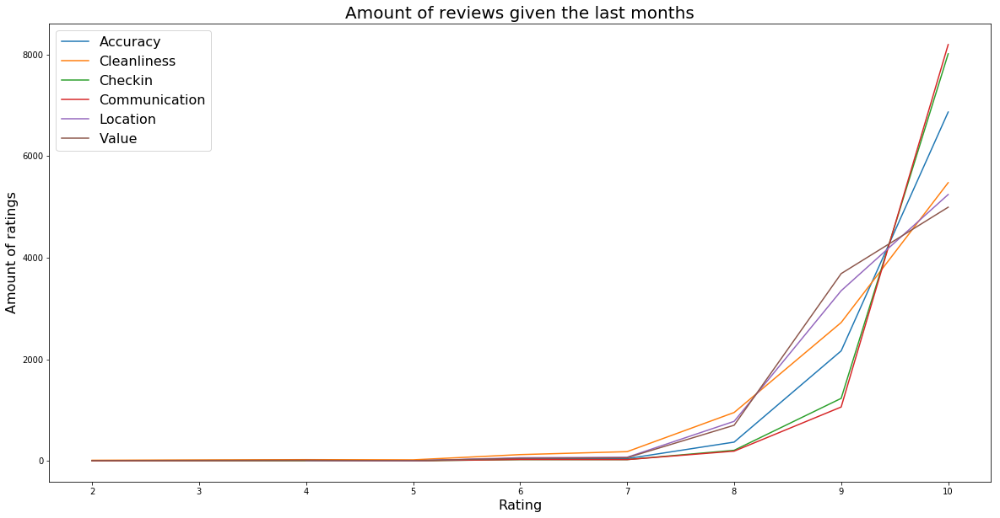

In [155]:
plt.figure(figsize=(20,10))

#plt.plot(rsr.keys(), rsr.values)
plt.plot(rsa.keys(), rsa.values)
plt.plot(rscl.keys(), rscl.values)
plt.plot(rsch.keys(), rsch.values)
plt.plot(rsco.keys(), rsco.values)
plt.plot(rsl.keys(), rsl.values)
plt.plot(rsv.keys(), rsv.values)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['Accuracy','Cleanliness','Checkin','Communication','Location','Value'], fontsize=16)
plt.xlabel('Rating', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

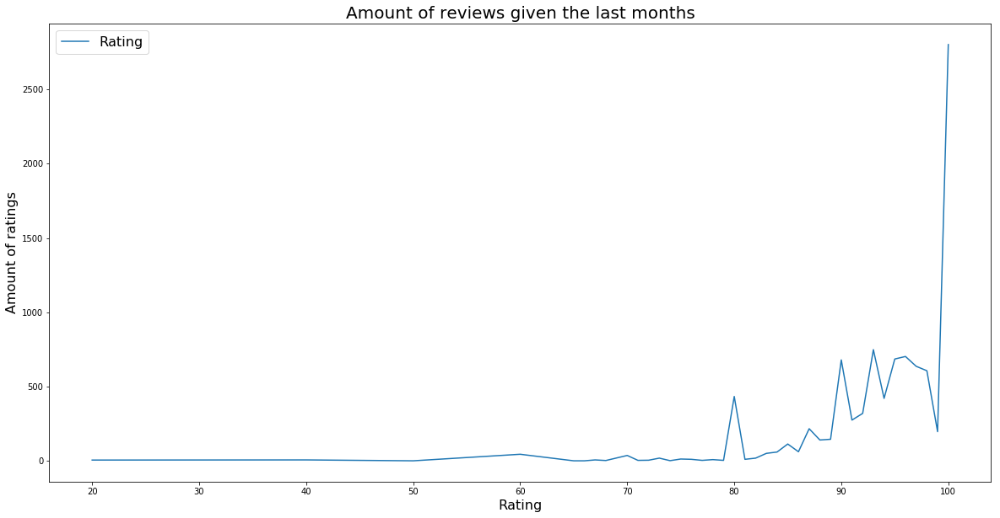

In [156]:
plt.figure(figsize=(20,10))
plt.plot(rsr.keys(), rsr.values)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['Rating'], fontsize=16)
plt.xlabel('Rating', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Amount of reviews given the last months', fontsize=20)
plt.show()

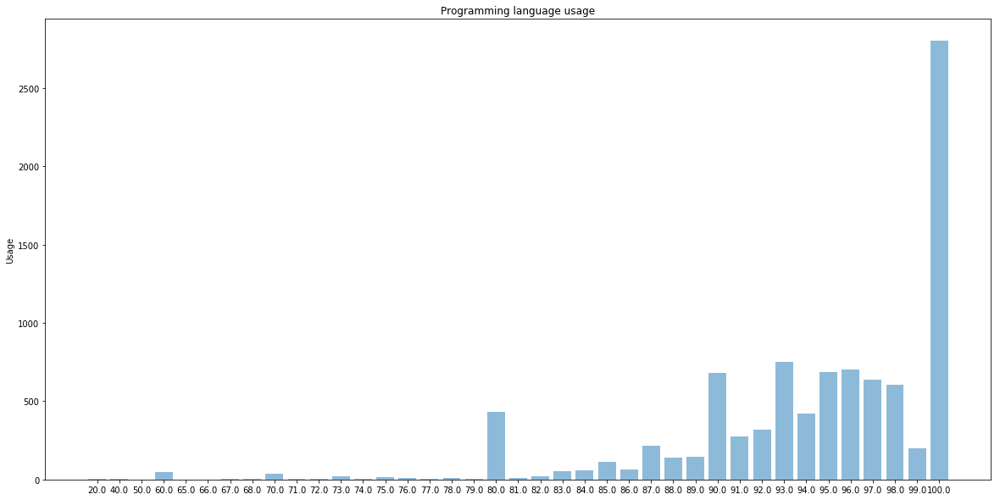

In [157]:
plt.figure(figsize=(20,10))
objects = rsr.keys()
y_pos = np.arange(len(objects))
performance = rsr.values
 
plt.bar(y_pos, performance, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Usage')
plt.title('Programming language usage')
 
plt.show()

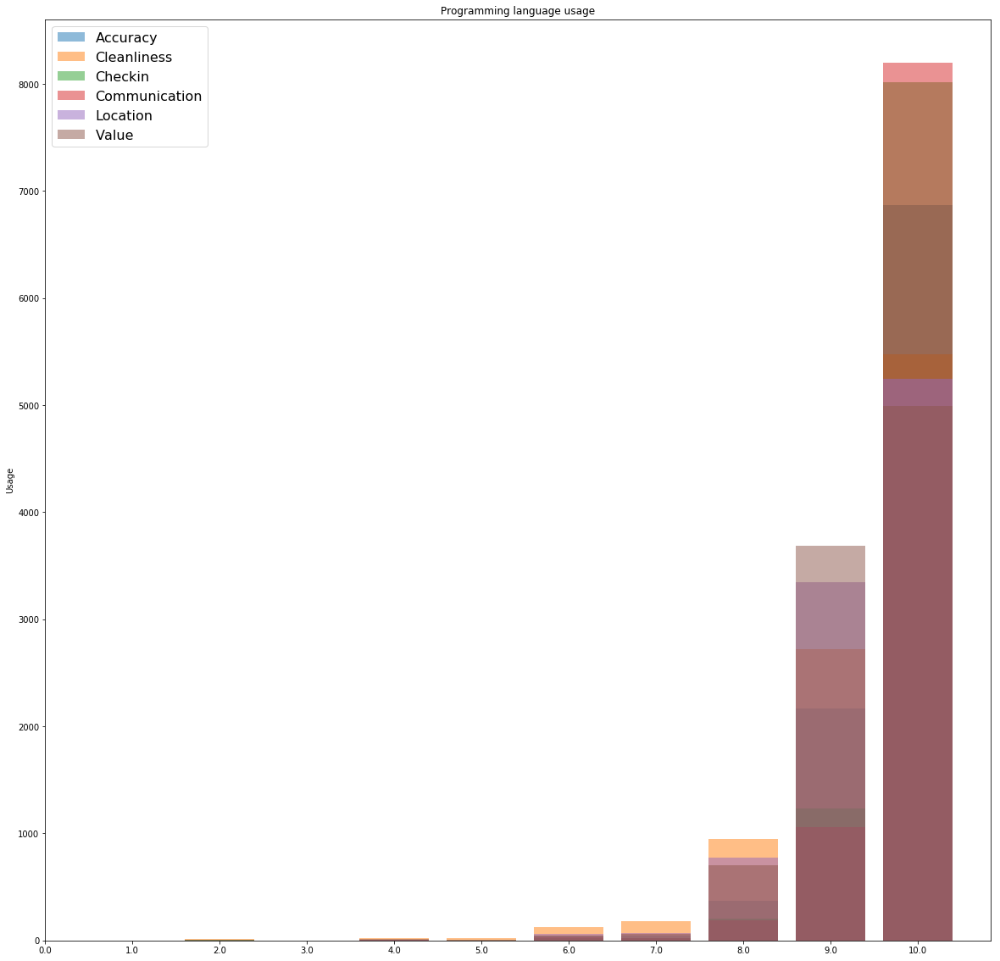

In [158]:
plt.figure(figsize=(20,20))
objects = np.arange(11.0)
y_pos = np.arange(11.0)
performance = rsr.values
    
plt.bar(rsa.keys(), rsa.values, align='center', alpha=0.5)
plt.bar(rscl.keys(), rscl.values, align='center', alpha=0.5)
plt.bar(rsch.keys(), rsch.values, align='center', alpha=0.5)
plt.bar(rsco.keys(), rsco.values, align='center', alpha=0.5)
plt.bar(rsl.keys(), rsl.values, align='center', alpha=0.5)
plt.bar(rsv.keys(), rsv.values, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.legend(['Accuracy','Cleanliness','Checkin','Communication','Location','Value'], fontsize=16)
plt.ylabel('Usage')
plt.title('Programming language usage')
 
plt.show()

In [ ]:
len(rscl.values)

9

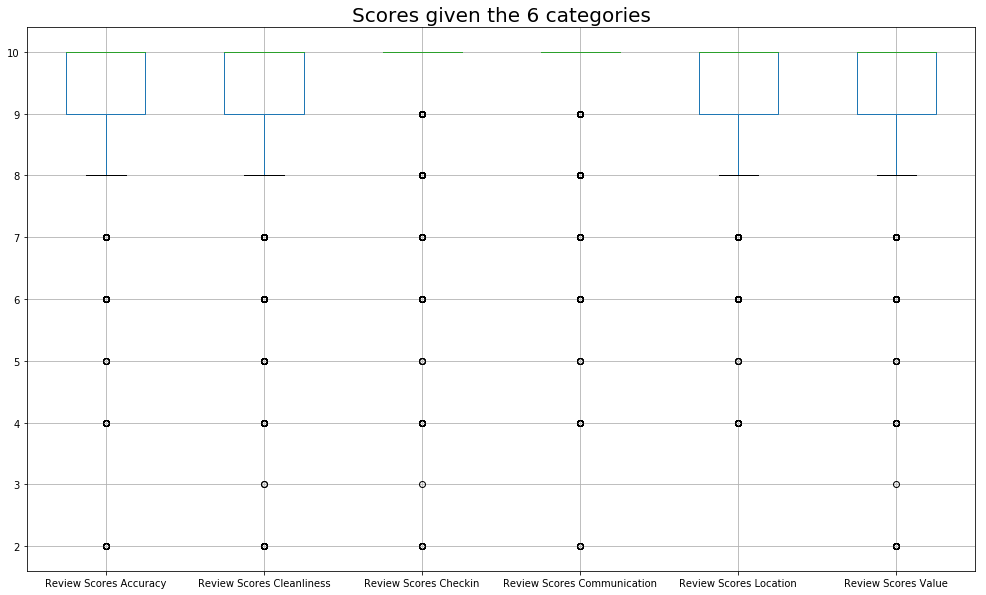

In [ ]:
df = pd.DataFrame(data = dataNotNan, columns = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value'])

bp = df.boxplot(figsize=(17,10))
plt.title("Scores given the 6 categories", fontsize=20 )

plt.savefig("boxplot.png", format="png")
plt.show()

-  Review Scores Rating
-  Review Scores Accuracy
-  Review Scores Cleanliness
-  Review Scores Checkin
-  Review Scores Communication
-  Review Scores Location
-  Review Scores Value

In [ ]:
ratings = ['Review Scores Accuracy','Review Scores Cleanliness','Review Scores Checkin','Review Scores Communication','Review Scores Location','Review Scores Value']

lengthAnd = []
lengthOr = []

for score in range(1,11):
    testAnd = dataNotNan[(dataNotNan[ratings[0]] <= score) 
           & (dataNotNan[ratings[1]] <= score)
           & (dataNotNan[ratings[2]] <= score)
           & (dataNotNan[ratings[3]] <= score)
           & (dataNotNan[ratings[4]] <= score)
           & (dataNotNan[ratings[5]] <= score)]

    testOr = dataNotNan[(dataNotNan[ratings[0]] <= score) 
           | (dataNotNan[ratings[1]] <= score)
           | (dataNotNan[ratings[2]] <= score)
           | (dataNotNan[ratings[3]] <= score)
           | (dataNotNan[ratings[4]] <= score)
           | (dataNotNan[ratings[5]] <= score)]
    lengthOr.append(len(testOr))
    lengthAnd.append(len(testAnd))

print(lengthOr, lengthAnd)

[0, 36, 38, 94, 131, 431, 825, 3145, 9688, 13103] [0, 0, 0, 3, 3, 11, 17, 76, 596, 13103]


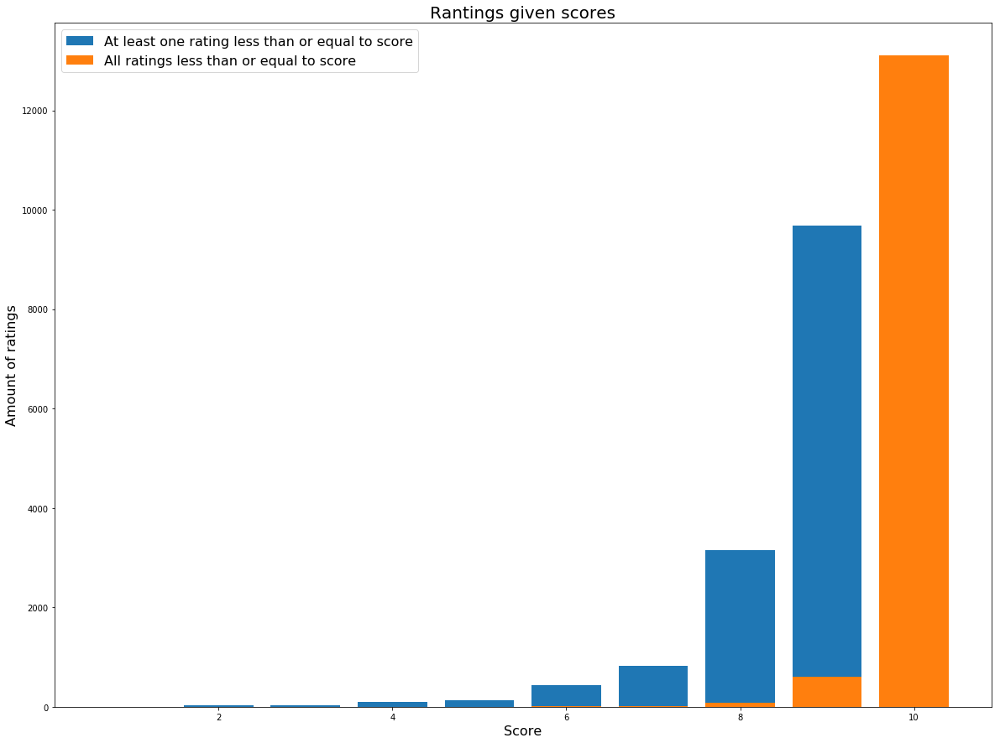

In [ ]:
plt.figure(figsize=(20,15))

plt.bar(range(1,11),lengthOr)
plt.bar(range(1,11),lengthAnd)

#plt.xticks(range(len(firstReviewData)), firstReviewData.keys(), rotation='vertical')
plt.legend(['At least one rating less than or equal to score','All ratings less than or equal to score'], fontsize=16)
plt.xlabel('Score', fontsize=16)
plt.ylabel('Amount of ratings', fontsize=16)
plt.title('Rantings given scores', fontsize=20)
plt.show()

In [ ]:
averageRatings = []
for r in ratings:
    averageRatings.append((r, sum(dataNotNan[r].values)/len(dataNotNan)))
    
averageRatings

[('Review Scores Accuracy', 9.64290620468595),
 ('Review Scores Cleanliness', 9.367167824162406),
 ('Review Scores Checkin', 9.786232160573915),
 ('Review Scores Communication', 9.813019919102496),
 ('Review Scores Location', 9.418301152407846),
 ('Review Scores Value', 9.403266427535678)]

In [ ]:
dataNotNan['Host Since Month'] = [fr[:7] if not isfloat(fr) else fr for fr in dataNotNan['Host Since'].values ]


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [ ]:
a = dataNotNan.groupby(['Host Since Month','Number of Reviews'])
a.count()['ID']

In [ ]:
a.count()['ID']

In [ ]:

#plt.figure(figsize=(20,10))
#plt.plot(dataNotNan['Host Since Month'], dataNotNan['Number of Reviews'])
#plt.show()

In [ ]:
dataNotNan.keys()

In [ ]:
# all text
text = ' '.join([s for s in dataNotNan['Summary'].values if not isfloat(s)])
text

# text in holmen
subset = dataNotNan.loc[dataNotNan['Neighbourhood'] == 'Christianshavn']
text = ' '.join([s for s in subset['Summary'].values if not isfloat(s)])
text

In [ ]:

wordcloud = WordCloud(background_color="white").generate(text)

# Display the generated image:
# the matplotlib way:
plt.figure(figsize=(20,20))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud.png')
plt.show()

In [ ]:
dataNotNan.groupby(['Market']).count()['ID']

In [ ]:
dataNotNan.groupby(['Zipcode']).count()['ID']